In [1]:
!pip install -q torch-scatter -f https://data.pyg.org/whl/torch-1.10.0+cu113.html
!pip install -q torch-sparse -f https://data.pyg.org/whl/torch-1.10.0+cu113.html
!pip install -q git+https://github.com/pyg-team/pytorch_geometric.git

     |████████████████████████████████| 7.9 MB 7.3 MB/s 
     |████████████████████████████████| 3.5 MB 7.5 MB/s 


In [2]:
from google.colab import drive
#@title 1.2 Prepare Folders
#@markdown If you connect your Google Drive, you can save the final image of each run on your drive.

google_drive = True #@param {type:"boolean"}

#@markdown Click here if you'd like to save the diffusion model checkpoint file to (and/or load from) your Google Drive:
yes_please = True #@param {type:"boolean"}

if google_drive is True:
  drive.mount('/content/drive')
  root_path = '/content/drive/MyDrive/Archi_Dataset/Data'
else:
  root_path = '/content'

Mounted at /content/drive


In [10]:
import torch
from torch_geometric.datasets import Reddit
import torch_geometric.transforms as T
from torch_geometric.nn import GCNConv
from torch_geometric.utils import train_test_split_edges

#import umap
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
from tqdm.notebook import tqdm
import time
import seaborn as sns
import networkx as nx
from sklearn.metrics import accuracy_score

import pickle

# 00 Dataset

In [4]:
dataset = Reddit(root = 'content/data')

Extracting content/data/raw/reddit.zip
Processing...
Done!


In [5]:
dataset.data.x[0][1]

tensor(9.0430)

In [6]:
data = dataset[0]

In [7]:
# Nodes: 232965, Node Features: 602, Edge Index: (2, 114M)
num_communities = len(set(data.y.numpy().tolist()))

print(f"Node Feature Matrix Info: # Nodes: {data.x.shape[0]}")
print(f"Node Feature Matrix Info: # Node Features: {data.x.shape[1]}")
print(f"Edge Index Shape: {data.edge_index.shape}")
print(f"Edge Weight: {data.edge_attr}")
print(f"# Community: {num_communities}")

# you can also check additional information
print(data.contains_isolated_nodes())
print(data.contains_self_loops())
print(data.is_directed())

Node Feature Matrix Info: # Nodes: 232965
Node Feature Matrix Info: # Node Features: 602
Edge Index Shape: torch.Size([2, 114615892])
Edge Weight: None
# Community: 41


/usr/local/lib/python3.7/dist-packages/torch_geometric/deprecation.py:12: UserWarning: 'contains_isolated_nodes' is deprecated, use 'has_isolated_nodes' instead
  warnings.warn(out)


False


/usr/local/lib/python3.7/dist-packages/torch_geometric/deprecation.py:12: UserWarning: 'contains_self_loops' is deprecated, use 'has_self_loops' instead
  warnings.warn(out)


False
False


## a.Getting Neighbor sampler of graph to train on smaller graph

In [19]:
from torch_geometric.loader import NeighborSampler
# Create Neighbor sampler
num_samples = [10, 5]
num_layers = len(num_samples)

train_neigh_sampler = NeighborSampler(
    data.edge_index, node_idx=data.train_mask+data.val_mask,
    sizes=num_samples, batch_size=1024, shuffle=True, num_workers=0)

subgraph_loader = NeighborSampler(
    data.edge_index, node_idx=None,
    sizes=[-1], batch_size=1024, shuffle=False, num_workers=0)

In [20]:
batch_size, n_id, adjs = next(iter(train_neigh_sampler))
batch_size, n_id, adjs

(1024,
 tensor([ 44258,  90431,   3342,  ..., 197590,  56573,  91586]),
 [EdgeIndex(edge_index=tensor([[ 4679,  8035, 10011,  ..., 45840, 45841, 45842],
        [    0,     0,     0,  ..., 10353, 10353, 10353]]), e_id=tensor([19175436, 22106901,  1304857,  ..., 98016866, 28565883, 46105770]), size=(45843, 10354)),
  EdgeIndex(edge_index=tensor([[ 1024,  1025,  1026,  ..., 10351, 10352, 10353],
        [    0,     0,     0,  ...,  1023,  1023,  1023]]), e_id=tensor([ 91702648,  16165264, 104863887,  ...,   8934931, 110042952,
         84036572]), size=(10354, 1024))])

In [158]:

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

X = data.x.to(device)
Y = data.y.squeeze().to(device)

batch_size, n_id, adjs = next(iter(train_neigh_sampler))
adjs = [adj.to(device) for adj in adjs]

x_batch = X[n_id]
y_batch = Y[n_id[:batch_size]]

In [159]:
adjs[1]

EdgeIndex(edge_index=tensor([[ 1024,  1025,  1026,  ..., 10327, 10328, 10329],
        [    0,     0,     0,  ...,  1023,  1023,  1023]], device='cuda:0'), e_id=tensor([ 62758399, 101411088, 100592502,  ...,  19318103,  19457720,
         31600746], device='cuda:0'), size=(10330, 1024))

In [160]:
X.shape,x_batch.shape,y_batch.shape

(torch.Size([232965, 602]), torch.Size([45496, 602]), torch.Size([1024]))

In [161]:
n_id

tensor([ 26170, 184078, 151705,  ..., 100987, 216975,  12204])

In [162]:
edge_index, e_id, size = adjs[0]
edge_index.shape,e_id.shape,size

(torch.Size([2, 51569]), torch.Size([51569]), (45496, 10330))

In [163]:
e_id.shape

torch.Size([51569])

In [164]:
edge_index.shape

torch.Size([2, 51569])

In [165]:
y_batch.shape

torch.Size([1024])

In [166]:
adjs[0][0]

tensor([[10330, 10331, 10332,  ..., 45493, 45494, 45495],
        [    0,     0,     0,  ..., 10329, 10329, 10329]], device='cuda:0')

In [167]:
adjs[0][1]

tensor([ 39920520,  23130844,  71369777,  ...,  50554641, 107246162,
          6360001], device='cuda:0')

In [168]:
dfy = pd.DataFrame(y_batch.cpu().numpy(),columns = ['class'])

## Viz network

In [169]:
adjs[1]

EdgeIndex(edge_index=tensor([[ 1024,  1025,  1026,  ..., 10327, 10328, 10329],
        [    0,     0,     0,  ...,  1023,  1023,  1023]], device='cuda:0'), e_id=tensor([ 62758399, 101411088, 100592502,  ...,  19318103,  19457720,
         31600746], device='cuda:0'), size=(10330, 1024))

In [170]:
edgearray = adjs[1][0].cpu().numpy().T
y = y_batch.cpu().numpy()
dfedges = pd.DataFrame(edgearray, columns = ['txId1','txId2'])

In [171]:
dfedges

,txId1,txId2
0,1024,0
1,1025,0
2,1026,0
3,1027,0
4,1028,0
...,...,...
9936,10325,1023
9937,10326,1023
9938,10327,1023
9939,10328,1023


In [180]:
indices = np.random.randint(edgearray.shape[0], size=9000)

In [181]:
sedge=dfedges.iloc[indices,:]

In [182]:
y.shape

(1024,)

In [183]:
sedge

,txId1,txId2
5621,6411,578
653,1669,67
9236,9693,952
4900,5744,505
1007,2020,103
...,...,...
137,1160,13
7377,8024,763
666,1682,68
9596,10013,989


In [184]:
n_color = y_batch.cpu().numpy()

In [185]:
n_color.shape

(1024,)

In [186]:
nodes = graph.nodes()
nodes

NodeView((2111, 113, 6268, 564, 5937, 528, 5839, 517, 4646, 385, 8933, 866, 5598, 488, 5863, 519, 6037, 539, 2265, 129, 3032, 645, 6830, 627, 1968, 97, 1935, 845, 6848, 629, 1266, 24, 6208, 557, 5833, 515, 7911, 748, 5959, 530, 8631, 830, 3598, 272, 1337, 32, 9134, 888, 5199, 446, 2698, 175, 5058, 430, 6125, 549, 1821, 82, 7553, 710, 5559, 484, 5014, 757, 3422, 253, 2368, 139, 2788, 185, 1348, 33, 2190, 121, 7223, 672, 3769, 289, 6147, 551, 214, 865, 762, 1022, 6870, 631, 3843, 297, 3812, 294, 9009, 874, 2663, 170, 1642, 64, 1248, 23, 6530, 591, 9820, 967, 7995, 759, 5009, 424, 9460, 924, 3573, 269, 4449, 363, 8467, 810, 4239, 340, 2320, 134, 7882, 745, 6091, 545, 2423, 145, 8312, 794, 8417, 805, 7446, 697, 3307, 240, 6107, 925, 5213, 447, 9725, 956, 8567, 822, 1595, 59, 7069, 653, 1967, 6754, 618, 8168, 779, 4076, 323, 4418, 360, 4577, 378, 3004, 208, 6066, 783, 6863, 630, 10271, 1017, 6621, 602, 4526, 372, 7099, 657, 1663, 66, 5333, 460, 8045, 765, 3557, 267, 7585, 713, 3112, 669, 98

No handles with labels found to put in legend.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  app.launch_new_instance()


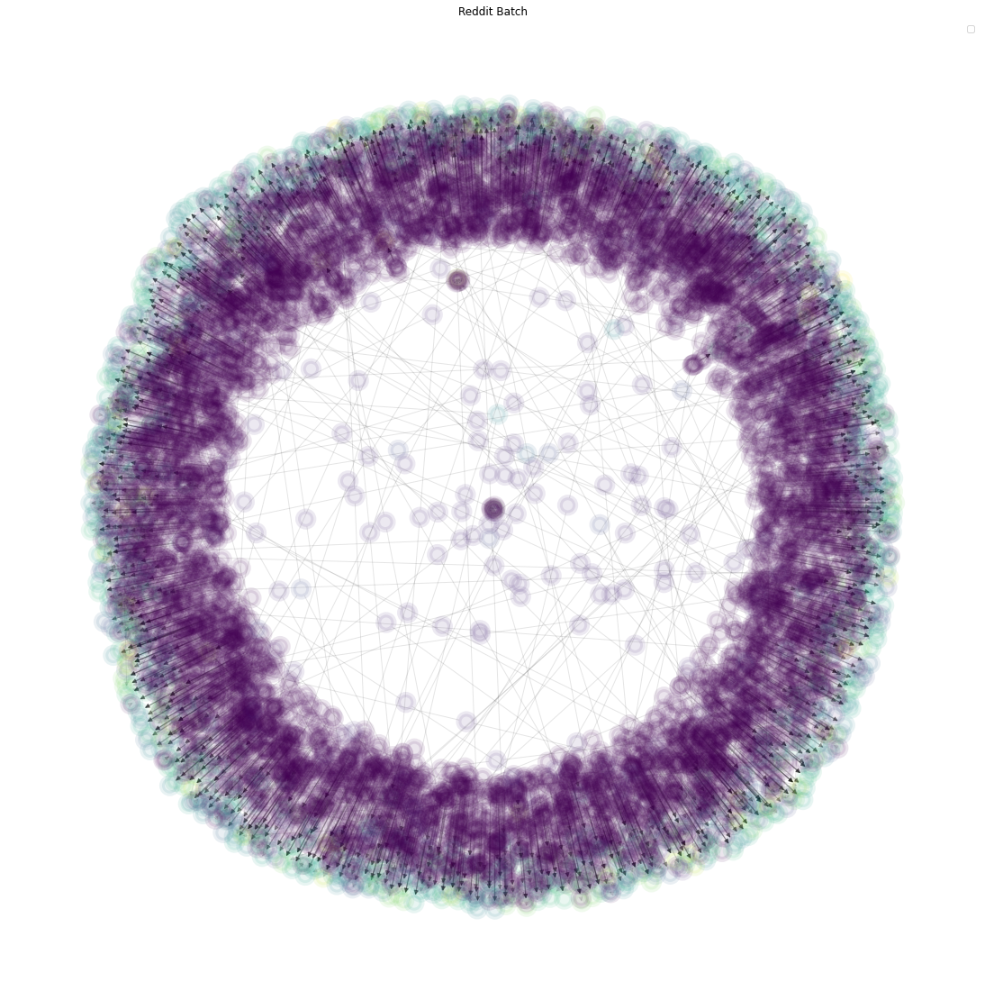

In [187]:
graph = nx.from_pandas_edgelist(sedge, source = 'txId1', target = 'txId2', 
                                 create_using = nx.DiGraph())

degrees = [val*.1 for (node, val) in graph.degree()]
nodes = graph.nodes()

#cats = y_batch.cpu().numpy()

plt.figure(1,figsize=(15,15)) 
seed = 31

pos = nx.spring_layout(graph, seed=seed)
nx.draw(graph, with_labels=False,alpha=0.1, pos=pos,linewidths=6,node_color=degrees,cmap='viridis')
plt.title("Reddit Batch")
plt.legend()
plt.tight_layout()

## b. Building base benchmark GIN model to predict community on graph

In [15]:
# Define Model
from torch.nn import Sequential, Linear, BatchNorm1d, ReLU, Dropout
from torch_geometric.nn import GINConv

class GIN(torch.nn.Module):
    def __init__(self, drop_rate, num_node_features, num_layers, hidden_size, out_channels):
        super(GIN, self).__init__()
        self.drop_rate = drop_rate
        self.num_node_features = num_node_features
        self.num_layers = num_layers
        self.hidden_size = hidden_size
        self.out_channels = out_channels

        self.gin_convs = torch.nn.ModuleList()
        self.gin_convs.append(
            GINConv(
                nn=Sequential(
                    Linear(in_features=num_node_features, out_features=hidden_size),
                    BatchNorm1d(num_features=hidden_size),
                    ReLU(),
                    Dropout(p=drop_rate),
                    Linear(hidden_size, hidden_size),
                    ReLU()
                )
            )
        )
        self.gin_convs.append(
            GINConv(
                nn=Sequential(
                    Linear(in_features=hidden_size, out_features=hidden_size),
                    BatchNorm1d(num_features=hidden_size),
                    ReLU(),
                    Dropout(p=drop_rate),
                    Linear(hidden_size, out_channels)
                )
            )
        )

    def forward(self, x_batch, adjs):
        # x_batch = X[n_id] or data.x[n_id]
        # x_batch = head_node_features + 1_hop_node_features + 2_hop_node_features
        for i, (edge_index, e_id, size) in enumerate(adjs):
            # size ex) (10399, 1024) or (45887, 10399)
            x_target = x_batch[:size[1]]
            x_batch = self.gin_convs[i]((x_batch, x_target), edge_index)

        out = F.log_softmax(x_batch, dim=-1)
        return out

    def inference(self, x_all):
        pbar = tqdm(total=x_all.size(0) * self.num_layers)
        pbar.set_description('Testing')

        for i in range(self.num_layers):
            xs = []
            for batch_size, n_id, adj in subgraph_loader:
                edge_index, _, size = adj.to(device)
                x = x_all[n_id].to(device)
                x_target = x[:size[1]]
                x = self.gin_convs[i]((x, x_target), edge_index)
                if i != self.num_layers - 1:
                    x = F.relu(x)
                xs.append(x.cpu())

                pbar.update(batch_size)

            x_all = torch.cat(xs, dim=0)

        pbar.close()
        return x_all


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = GIN(
    drop_rate=0.2, num_node_features=data.num_node_features, num_layers=num_layers,
    hidden_size=128, out_channels=num_communities
)
model = model.to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

X = data.x.to(device)
Y = data.y.squeeze().to(device)

In [16]:
X.shape,num_layers

(torch.Size([232965, 602]), 2)

## c. Train base model to find accuracy to beat

In [ ]:
from collections import defaultdict
import torch.nn.functional as F 
def train(epoch,X,Y):
    model.train()

    pbar = tqdm(total=int(data.train_mask.sum()))
    pbar.set_description(f'Epoch {epoch:02d}')

    total_loss = total_correct = 0
    for batch_size, n_id, adjs in train_neigh_sampler:
        edge_index, e_id, size = adjs[1]
        #print(X[n_id].shape,edge_index.shape,e_id.shape,size)
        adjs = [adj.to(device) for adj in adjs]
        
        optimizer.zero_grad()
        
        out = model(X[n_id], adjs)
        #print(out.shape)
        loss = F.nll_loss(out, Y[n_id[:batch_size]])
        loss.backward()
        optimizer.step()

        total_loss += float(loss)
        total_correct += int(out.argmax(dim=-1).eq(Y[n_id[:batch_size]]).sum())
        pbar.update(batch_size)

    pbar.close()

    loss = total_loss / len(train_neigh_sampler)
    approx_acc = total_correct / int(data.train_mask.sum()+data.val_mask.sum())
    return loss, approx_acc


@torch.no_grad()
def test(Y):
    model.eval()
    out = model.inference(X)

    y_true = Y.cpu().unsqueeze(-1)
    y_pred = out.argmax(dim=-1, keepdim=True)

    results = []
    for mask in [data.train_mask+data.val_mask, data.test_mask]:
        results += [int(y_pred[mask].eq(y_true[mask]).sum()) / int(mask.sum())]
    return results

train_accs = defaultdict(list)
test_accs = defaultdict(list)

for epoch in range(1, 21):
    loss, acc = train(epoch,X,Y)
    print(f'Epoch {epoch:02d}, Loss: {loss:.4f}, Approx. Train: {acc:.4f}')

    train_acc, test_acc = test(Y)
    print(f'Train: {train_acc:.4f}, Test: {test_acc:.4f}')
    train_accs[epoch].append(train_acc)
    test_accs[epoch].append(test_acc)

In [ ]:
train_accs

defaultdict(list,
            {1: [0.8449018966275907],
             2: [0.8774074533741016],
             3: [0.876115580327425],
             4: [0.8768263925714479],
             5: [0.8900836050591779],
             6: [0.8976204713926279],
             7: [0.8927181234556758],
             8: [0.8974625131161783],
             9: [0.8936827972154212],
             10: [0.90436754634383],
             11: [0.9049937380826122],
             12: [0.9031997833715066],
             13: [0.9034085139511007],
             14: [0.8841996592614322],
             15: [0.8968701695794925],
             16: [0.9055296679491375],
             17: [0.8981112703230246],
             18: [0.9036398099987589],
             19: [0.8980548566528641],
             20: [0.8995949498482472]})

In [ ]:
train = pd.DataFrame.from_dict(train_accs, orient='index',
                       columns=['train'])
test = pd.DataFrame.from_dict(test_accs, orient='index',
                       columns=['test'])


In [ ]:
df = pd.concat([train, test], axis=1)

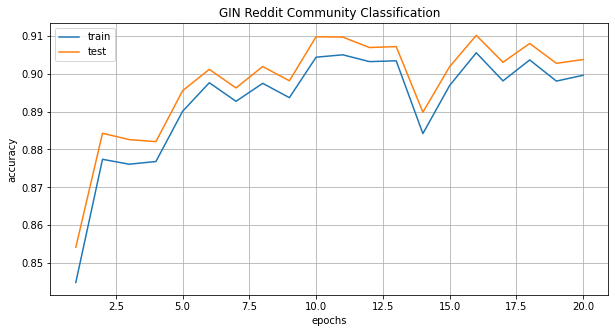

In [ ]:



df.plot( figsize=(10, 5), grid=True)
plt.xlabel('epochs')
plt.ylabel('accuracy')

plt.title("GIN Reddit Community Classification")
plt.show()

# 01 Clustering

## a.Kmeans & EM (importing necessary libraries)

In [8]:
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
from sklearn.decomposition import FastICA
from sklearn.random_projection import GaussianRandomProjection,SparseRandomProjection
from sklearn.neural_network import MLPClassifier
from sklearn.feature_selection import RFE
from sklearn.svm import SVR
from sklearn.metrics import accuracy_score
from collections import Counter
from collections import defaultdict
from datetime import datetime
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.metrics import accuracy_score
from sklearn.metrics.cluster import adjusted_mutual_info_score
from sklearn.metrics.cluster import adjusted_mutual_info_score,adjusted_rand_score,homogeneity_score,completeness_score,v_measure_score


In [18]:
train_features = data.x.numpy()
orig_labels = data.y.squeeze().numpy()

In [ ]:
scaler = StandardScaler()
scaler.fit(train_features)
scaler.mean_
scaler.transform(train_features)

array([[ 1.2115321 ,  9.012869  , -0.9309329 , ..., -0.2477256 ,
         0.29974267, -0.38331378],
       [-0.13647547, -0.20220488,  0.11738677, ...,  0.16809936,
         0.09185399, -0.6601205 ],
       [-0.1310618 , -0.1962443 , -0.03948911, ...,  0.04714761,
         0.27473977,  0.26972497],
       ...,
       [-0.06068389, -0.20220488,  0.95736814, ...,  1.1219893 ,
        -1.4562324 , -0.24559085],
       [-0.15813023, -0.20220488, -0.0990067 , ...,  0.7581469 ,
        -0.5218608 , -2.238939  ],
       [ 0.0908993 ,  0.28060302,  0.16633737, ...,  0.23167528,
         0.58734214,  0.55476445]], dtype=float32)

## b.Creating utils 

In [19]:
def cluster_measures(orig_labels,preds):
  measures = {"homogeneity":homogeneity_score(orig_labels,preds),
              "completeness":completeness_score(orig_labels,preds),
              "v_measure":v_measure_score(orig_labels,preds),
              "adjusted_rand_score":adjusted_rand_score(orig_labels,preds),
              "adjusted_mutual_info_score":adjusted_mutual_info_score(orig_labels,preds)}
  return measures

def create_plotvals(results,title,ks):
  kk = defaultdict(list)
  if title == 'kmeans':
    typmeasure = 'inertia'
  if title == 'em':
    typmeasure = "bic"

  inertias = defaultdict(list)
  times = defaultdict(list)
  for k in results.keys():
    measures = results[k]['measures']
    inertias[k].append(results[k][typmeasure])
    times[k].append(results[k]['time'])

    for m in measures.keys():
      kk[m].append(measures[m])

  df = pd.DataFrame.from_dict(kk, orient='index').T

  fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(24, 8))

  
  max = df.max(numeric_only=True).max()
  min = df.min(numeric_only=True).min()

  axes[0].plot(list(inertias.keys()), list(inertias.values()))
  axes[0].set_xlabel(r'Number of clusters *k*')
  axes[0].set_title(typmeasure)
  axes[0].set_ylabel('Sum of squared distance')
  
  

  axes[1].plot(list(times.keys()),list(times.values()))
  axes[1].set_xlabel(r'Number of clusters *k*')
  axes[1].set_ylabel('Time in Seconds')
  axes[1].set_title('Time')
  

  axes[2] = sns.lineplot(data = df,alpha=0.8,markers=True, dashes=False,markersize=14)
  axes[2].set(xlabel = r'Number of clusters *k*', ylabel = "Score")
  axes[2].set_xticks(range(len(ks)))
  axes[2].set_xticklabels([str(x) for x in ks])
  axes[2].set_title(title)
  fig.tight_layout()

In [20]:
def kmeanswrap(train_features,orig_labels, ks = [2,5,10,20]):
  #kmeans
  #ks = [2,5,10,20]

  kmdict = defaultdict(dict)

  for k in ks:
    print(k)
    startTime = time.time()
    km = KMeans(n_clusters=k, random_state=0).fit(train_features)
    preds = km.predict(train_features)
    centroids = km.cluster_centers_
    
    endTime = time.time()
    totaltime = endTime - startTime

    clustermeasures = cluster_measures(orig_labels,preds)

    kmdict[k] ={"preds":preds, 
                "inertia":km.inertia_,  
                "centroid":centroids,
                "time":totaltime,
                "measures": clustermeasures}
  return kmdict

def emwrap(train_features,orig_labels,ks = [2,5,10,20]):
  #ks = [2,5,10,20]

  gmpreds = []
  gmtimes = []

  gm_bic= []
  gm_score=[]
  gmdict = defaultdict(dict)
  for k in ks:
      print(k)
      startTime = time.time()
      gm = GaussianMixture(n_components=k).fit(train_features)
      preds = gm.predict(train_features)
      bic = -gm.bic(train_features)
      score = gm.score(train_features)

      endTime = time.time()
      totaltime = endTime-startTime
      
      clustermeasures = cluster_measures(orig_labels,preds)

      gmdict[k] ={"preds":preds, 
                  "bic":bic,  
                  "time":totaltime,
                  "measures": clustermeasures}
  return gmdict

## c. KMEANS

In [ ]:
kmdict = kmeanswrap(train_features,orig_labels)


2
5
10
20


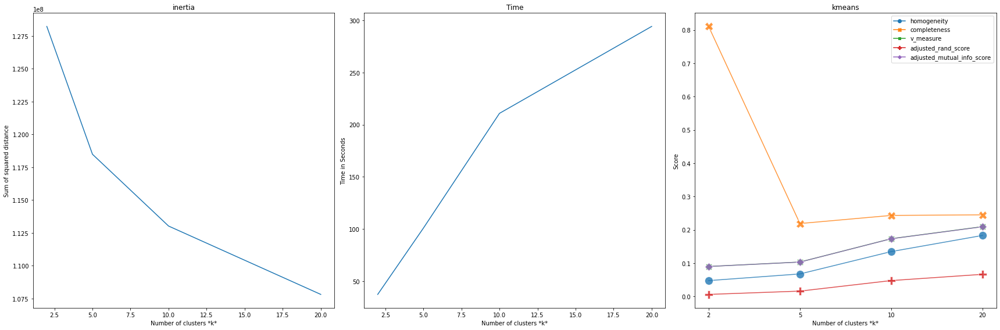

In [ ]:
ks = [2,5,10,20]
create_plotvals(results=kmdict,title='kmeans',ks=ks)

## d. EM

In [ ]:
gmdict = emwrap(train_features,orig_labels)

2
5
10
20


/usr/local/lib/python3.7/dist-packages/sklearn/mixture/_base.py:282: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  ConvergenceWarning,


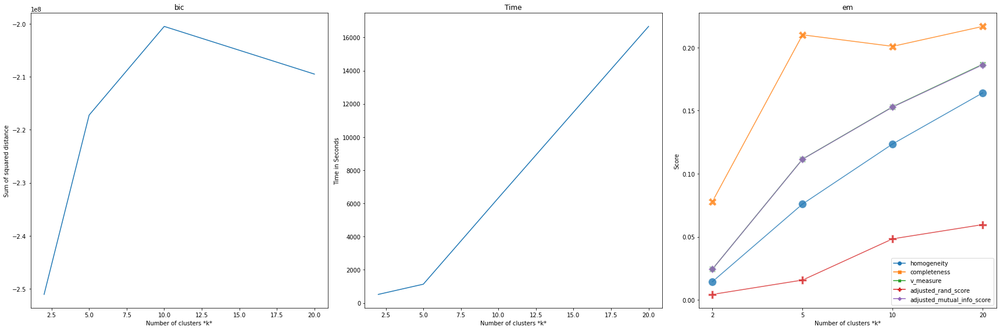

In [ ]:
create_plotvals(results=gmdict,title='em',ks=ks)

# 02 Dimension Reduction
---



1.   PCA
2.   ICA
3.   RP (Randomized Projections)
4.   RFE (Recursive Feature Elimination)

## a. PCA

In [ ]:

PCA_components = [2,10,20,50]

data_PCA = PCA(random_state=0)
data_eigen = data_PCA.fit(train_features)
data_eigenvalues = data_eigen.explained_variance_

pca_results = defaultdict(dict)

for PCA_comp in PCA_components :
    print(PCA_comp)
    _PCA = PCA(n_components=PCA_comp,random_state=0)
    _PCA_data = _PCA.fit_transform(train_features)

    #print(_PCA.explained_variance_ratio_)
    #print(_PCA_data.shape)
    #print(_PCA.explained_variance_)

    _data_PCA_df = pd.DataFrame(data = _PCA_data)
    _data_PCA_df_labels = pd.concat([_data_PCA_df,pd.DataFrame(orig_labels,columns=['class'])],axis=1)
        
    kmeansdict = kmeanswrap(_data_PCA_df,orig_labels)
    emdict = emwrap(_data_PCA_df,orig_labels)
    
    pca_results[PCA_comp] ={"data":_data_PCA_df_labels, "var_ratio":_PCA.explained_variance_ratio_, 
                            "comps":_PCA.components_, "var":_PCA.explained_variance_,
                            "mean":_PCA.mean_,
                            "kmean":kmeansdict,
                            "em":emdict}

root_path = '/content/drive/MyDrive/Archi_Dataset/Data'
pckpath = os.path.join(root_path,"dataset_b_pca.pickle")
with open(pckpath, 'wb') as handle:
    pickle.dump(pca_results, handle, protocol=pickle.HIGHEST_PROTOCOL)  

2
[0.10165377 0.05809579]
(232965, 2)
[61.09064061 34.91369911]
2
5
10
20
2
5
10
20
10
[0.10165377 0.05809572 0.05418673 0.02598611 0.02242584 0.02102525
 0.01468015 0.0143297  0.01247091 0.01210999]
(232965, 10)
[61.09064061 34.91365833 32.56447992 15.61681741 13.47720571 12.63550055
  8.82229658  8.61168786  7.49461612  7.27771244]
2
5
10
20
2
5
10
20
20
[0.10165368 0.05809574 0.05418671 0.0259861  0.02242581 0.02102525
 0.01468016 0.01432971 0.0124715  0.01211051 0.01144309 0.0111745
 0.00998554 0.00956304 0.00918079 0.00828365 0.00783459 0.00748356
 0.00725988 0.00704017]
(232965, 20)
[61.09058481 34.91366477 32.56446919 15.61680882 13.47719068 12.63550055
  8.82230087  8.61169644  7.49496811  7.2780274   6.8769268   6.71551238
  6.00098889  5.74708163  5.51735944  4.97820962  4.7083353   4.49737969
  4.36295683  4.23091792]
2
5
10
20
2
5
10
20
50
[0.10165368 0.05809579 0.05418673 0.0259861  0.02242583 0.02102526
 0.01468017 0.01432973 0.0124715  0.01211055 0.0114432  0.0111745
 0.

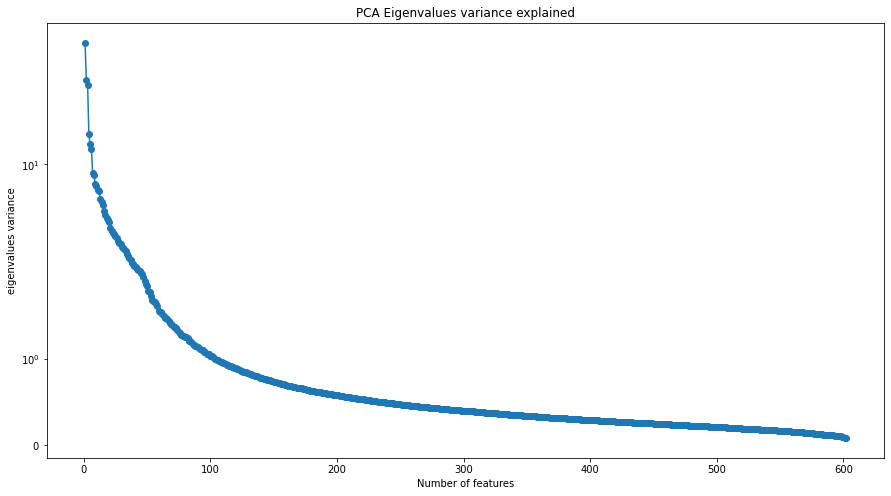

In [ ]:
# plot pca
featsize = np.arange(1,data_eigenvalues.shape[0]+1)


plt.figure(figsize=(15, 8))
plt.plot(featsize, data_eigenvalues, '-o')
plt.xlabel(r'Number of features')
plt.ylabel('eigenvalues variance');
#plt.xticks(np.arange(1,data_eigenvalues.shape[0]+1,5))

plt.yscale('symlog') 
plt.title('PCA Eigenvalues variance explained');

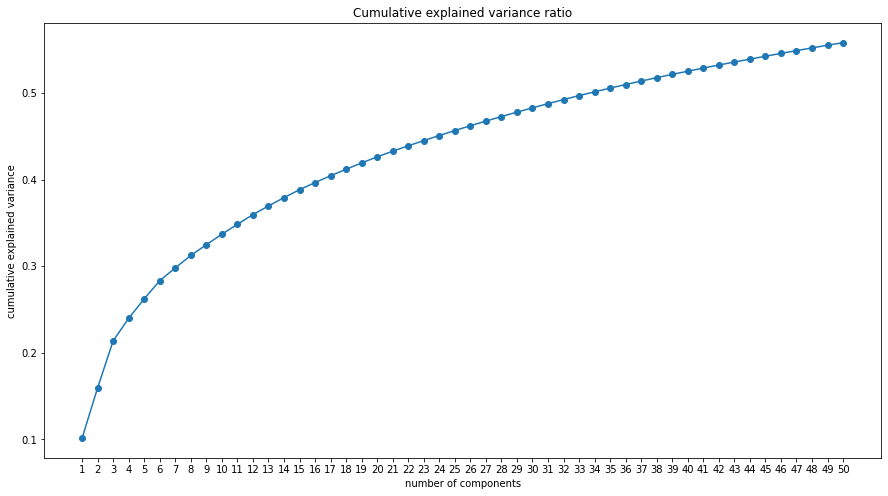

In [ ]:
ratio = pca_results[50]['var_ratio']
plt.figure(figsize=(15, 8))
plt.plot(np.arange(1,51,1),np.cumsum(ratio),'-o')
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');
plt.title("Cumulative explained variance ratio")
plt.xticks(np.arange(1,51,1))
plt.show()

In [ ]:
def plot_comp(results,title):
  from matplotlib.lines import Line2D
  from itertools import cycle
  results.rename(columns = {results.columns[0]:'component1', results.columns[1]:'component2'}, inplace = True)
  
  markers = Line2D.filled_markers
  cycle(markers)
  groups = results.groupby('class')

  markers = Line2D.filled_markers

  # Plot
  fig, ax = plt.subplots(figsize=(20,12))
  ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
  for (name, group), marker in zip(groups, cycle(markers)):
      ax.plot(group.component1, group.component2, marker=marker, linestyle='', alpha=.7, label=name)
      ax.set_title(f"{title} 2Component Plot")
      ax.set_xlabel("component1")
      ax.set_ylabel("component2")
      ax.grid()
  ax.legend(bbox_to_anchor=(1,1), loc="upper right")

  plt.show()

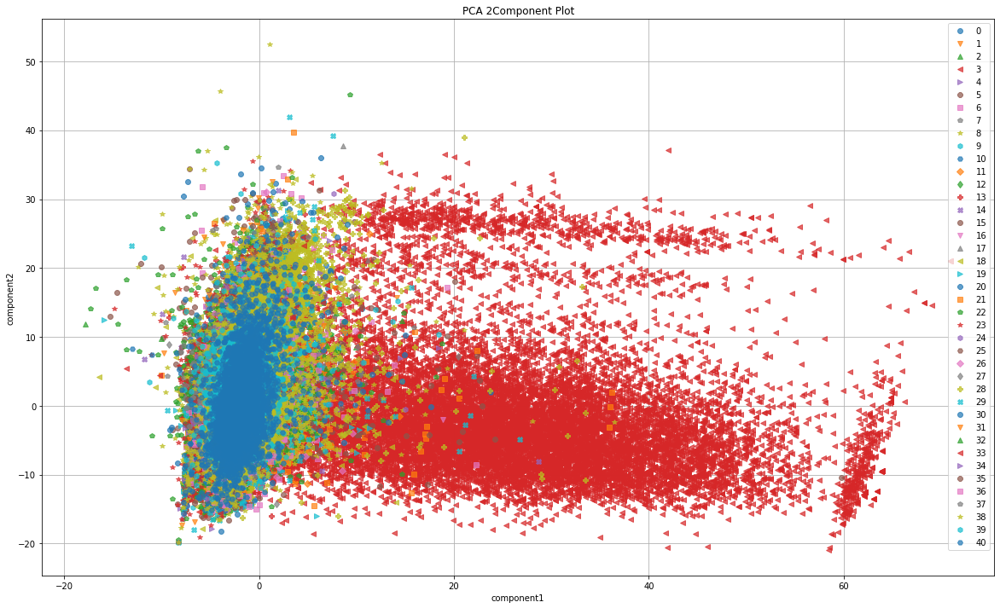

In [ ]:
plot_comp(results=pca_results[2]['data'],title="PCA")

## b.ICA

In [ ]:
data_ICA = FastICA(random_state=0)
ICA_transform = data_ICA.fit_transform(train_features)

ICA_df = pd.DataFrame(data = ICA_transform)
ICA_kurtosis = ICA_df.kurt()


ICA_components = [2,10,20,50]
ICA_results = defaultdict(dict)

for ICA_comp in ICA_components :
  start = time.time()
  print(ICA_comp)
  _ICA = FastICA(n_components=ICA_comp,random_state=0)
  _ICA_data = _ICA.fit_transform(train_features)
  #print(_ICA.components_)
  _ICA_df = pd.DataFrame(data = _ICA_data)
  _data_ICA_df = pd.DataFrame(data = _ICA_data)
  kurt = _data_ICA_df.kurt()
  _data_ICA_df_labels = pd.concat([_data_ICA_df,pd.DataFrame(orig_labels,columns=['class'])],axis=1)
  end = time.time() - start
  ICA_results[ICA_comp] ={"data":_data_ICA_df_labels, "kurt":kurt,"time":{end},"comp":_ICA.components_ ,"mixing":_ICA.mixing_}
  
  kmeansdict = kmeanswrap(_data_ICA_df,orig_labels)
  emdict = emwrap(_data_ICA_df,orig_labels)

  ICA_results[ICA_comp] ={"data":_data_ICA_df_labels, "kurt":kurt,"time":{end},"comp":_ICA.components_ ,"mixing":_ICA.mixing_,
                          "kmean":kmeansdict,
                          "em":emdict}

root_path = '/content/drive/MyDrive/Archi_Dataset/Data'
pckpath = os.path.join(root_path,"dataset_b_ica.pickle")
with open(pckpath, 'wb') as handle:
    pickle.dump(ICA_results, handle, protocol=pickle.HIGHEST_PROTOCOL)

/usr/local/lib/python3.7/dist-packages/sklearn/decomposition/_fastica.py:119: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  ConvergenceWarning,


2
2
5
10
20
2
5
10
20
10
2
5
10
20
2
5
10
20
20
2
5
10
20
2
5
10
20
50
2
5
10
20
2
5
10
20


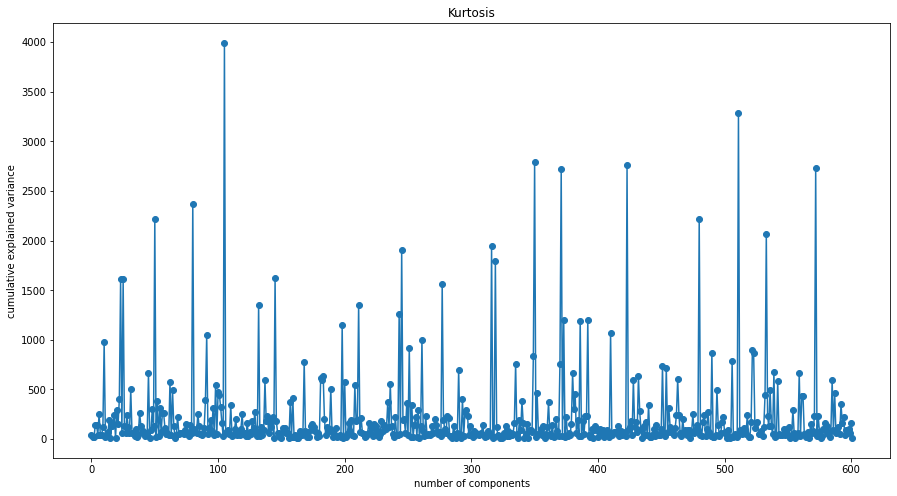

In [ ]:
#kurtosis
plt.figure(figsize=(15, 8))
plt.plot(ICA_kurtosis,'-o')
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');
plt.title("Kurtosis")

plt.show()

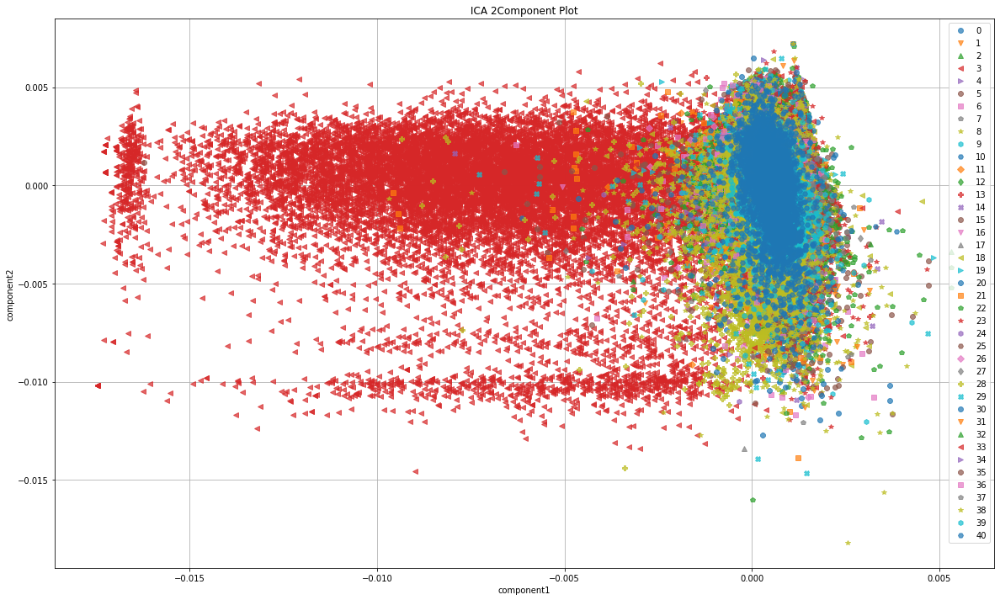

In [ ]:
plot_comp(results=ICA_results[2]['data'],title="ICA")

[12.899660132453523, 16.89436889930851, 22.62735795407041, 39.33772914769268]


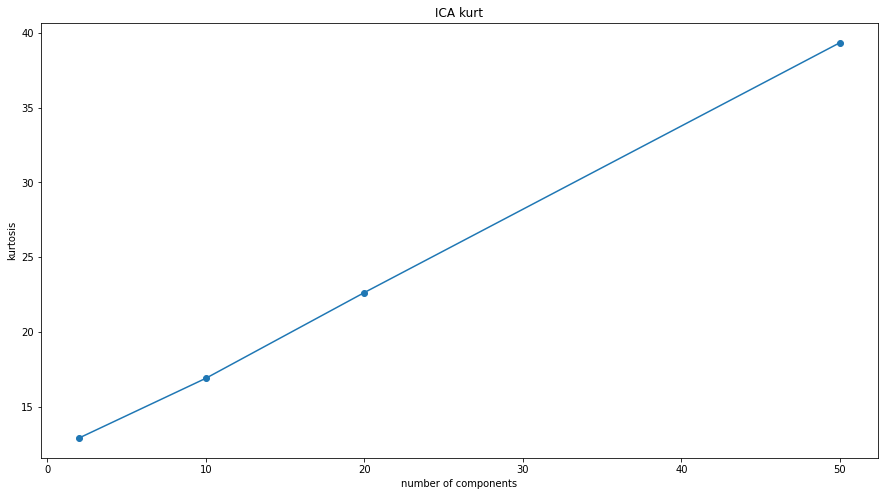

In [ ]:
kurts = []
keys = []
for i in ICA_results.keys():
  keys.append(i)
  kurts.append(np.mean((ICA_results[i]['kurt'])))

xticks = np.arange(1,len(kurts)+1)
#kurtosis
print(kurts)
plt.figure(figsize=(15, 8))
plt.plot(keys,kurts,'-o')
plt.xlabel('number of components')
plt.ylabel('kurtosis')
#plt.xticks(xticks)
plt.title("ICA kurt")
#plt.yscale('symlog')
plt.show()

## c. RP

In [ ]:
RP_components = [2,10,20,50]
NN_RP_score = defaultdict(dict)
my_accuracy_kmeans_RP = defaultdict(dict)
my_time_kmeans_RP = defaultdict(dict)
my_accuracy_em_RP = defaultdict(dict)
my_time_em_RP = defaultdict(dict)



RP =GaussianRandomProjection(random_state=0,n_components=11)
RP_data = RP.fit_transform(train_features)
RP_df = pd.DataFrame(data = RP_data)
RP_kurtosis = RP_df.kurt()

rp_results = defaultdict(dict)

for RP_comp in RP_components:
  start = time.time()
  _data_RP = GaussianRandomProjection(n_components=RP_comp,random_state=0)
  _data_RP_data = _data_RP.fit_transform(train_features)
  _data_RP_df = pd.DataFrame(data = _data_RP_data)
  _RP_kurtosis = RP_df.kurt()
  _data_RP_df_label = pd.concat([_data_RP_df,pd.DataFrame(orig_labels,columns=['class'])],axis=1)
  end = time.time() - start

  kmeansdict = kmeanswrap(_data_RP_df,orig_labels)
  emdict = emwrap(_data_RP_df,orig_labels)

  rp_results[RP_comp] ={"data":_data_RP_df_label,"time":{end},"comp":_data_RP.components_ ,
                          "kmean":kmeansdict,
                          "em":emdict}


root_path = '/content/drive/MyDrive/Archi_Dataset/Data'
pckpath = os.path.join(root_path,"dataset_b_rp.pickle")
with open(pckpath, 'wb') as handle:
    pickle.dump(rp_results, handle, protocol=pickle.HIGHEST_PROTOCOL)

2
5
10
20
2
5
10
20
2
5
10
20
2
5
10
20
2
5
10
20
2
5
10
20
2
5
10
20
2
5
10
20


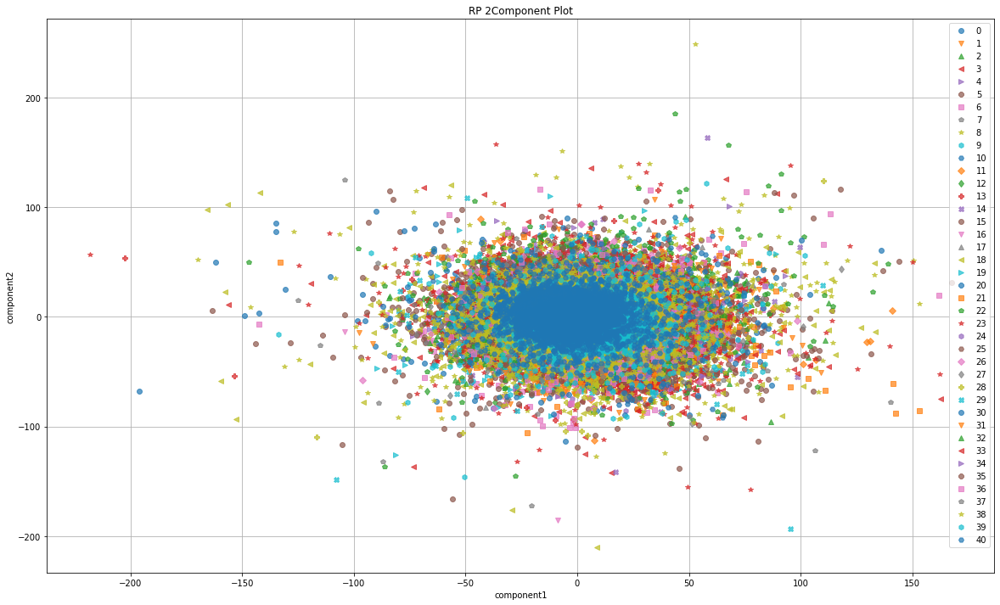

In [ ]:
plot_comp(results=rp_results[2]['data'],title="RP")

# 03 - USING DIMENSION REDUCTION AS NEW FEATURES FOR NN

In [21]:
import pickle
root_path = '/content/drive/MyDrive/Archi_Dataset/Data'
pckpath = os.path.join(root_path,"dataset_b_pca.pickle")

file = open(pckpath,'rb')
object_file = pickle.load(file)



In [22]:
data.y.squeeze()

tensor([30, 17, 18,  ...,  3, 13, 13])

In [23]:
from collections import defaultdict
import torch.nn.functional as F

def converttotensor(datax):
  new_x = datax['data'].drop(['class'], axis=1).to_numpy()
  new_tensor = torch.Tensor(new_x)

  device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

  X = new_tensor.to(device)
  Y = data.y.squeeze().to(device)
  """
  batch_size, n_id, adjs = next(iter(train_neigh_sampler))
  adjs = [adj.to(device) for adj in adjs]

  x_batch = X[n_id]
  y_batch = Y[n_id[:batch_size]]
  """
  return X, Y

@torch.no_grad()
def test(X,Y):
    model.eval()
    out = model.inference(X)

    y_true = Y.cpu().unsqueeze(-1)
    y_pred = out.argmax(dim=-1, keepdim=True)

    results = []
    for mask in [data.train_mask+data.val_mask, data.test_mask]:
        results += [int(y_pred[mask].eq(y_true[mask]).sum()) / int(mask.sum())]
    return results


In [24]:
object_file.keys()

dict_keys([2, 10, 20, 50])

In [36]:
import gc
dimred = defaultdict(dict)
task = 'PCA_GIN'

print(f"current task {task} keys: {object_file.keys()}")

for key in object_file.keys():
  print(f"CURRENT KEY {key}")
  datainput = object_file[key]
  
  gc.collect()
  torch.cuda.empty_cache()
  #########################################################################
  #select dim reduction features

  X,Y=converttotensor(datainput)
  num_node_features = X.shape[1]

  print(X.shape,Y.shape)
  #########################################################################
  #create model with new features size
  device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
  model = GIN(
        drop_rate=0.2, num_node_features=num_node_features, num_layers=num_layers,
        hidden_size=128, out_channels=num_communities
    )
  model = model.to(device)
  optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

  ########################################################################
  #train model and get results
  dimred = defaultdict(dict)
  train_accs = []
  test_accs = []
  loss_dict = []

  start= time.time()
  for epoch in range(1, 21):
    model.train()

    pbar = tqdm(total=int(data.train_mask.sum()))
    pbar.set_description(f'Epoch {epoch:02d}')

    total_loss = total_correct = 0
    for batch_size, n_id, adjs in train_neigh_sampler:
        edge_index, e_id, size = adjs[1]
        #print(X[n_id].shape,edge_index.shape,e_id.shape,size)
        
        adjs = [adj.to(device) for adj in adjs]
        
        optimizer.zero_grad()
      
        out = model(X[n_id], adjs)
        #print(out.shape)

        loss = F.nll_loss(out, Y[n_id[:batch_size]])
        loss.backward()
        optimizer.step()

        total_loss += float(loss)
        total_correct += int(out.argmax(dim=-1).eq(Y[n_id[:batch_size]]).sum())
        pbar.update(batch_size)

    pbar.close()
    #test model
    train_acc, test_acc =test(X,Y)
    
    loss = total_loss / len(train_neigh_sampler)
    print(f'Epoch {epoch:02d}, Loss: {loss:.4f},train_acc: {train_acc:.4f}, test_acc: {test_acc:.4f}')
    approx_acc = total_correct / int(data.train_mask.sum()+data.val_mask.sum())
    
    train_accs.append(train_acc)
    test_accs.append(test_acc)
    loss_dict.append(loss)

  totaltime=  time.time()-start

  outresults =  {"time":totaltime,"loss":loss_dict, 'train':train_accs,"test":test_accs}
  dimred[key] = outresults


print("SAVING....")
root_path = '/content/drive/MyDrive/Archi_Dataset/Data'
pckpath = os.path.join(root_path,f"{task}.pickle")
with open(pckpath, 'wb') as handle:
  pickle.dump(dimred, handle, protocol=pickle.HIGHEST_PROTOCOL)

current task PCA_GIN keys: dict_keys([2, 10, 20, 50])
CURRENT KEY 2
torch.Size([232965, 2]) torch.Size([232965])


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 01, Loss: 2.1770,train_acc: 0.0968, test_acc: 0.0851


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 02, Loss: 2.0147,train_acc: 0.0956, test_acc: 0.0851


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 03, Loss: 1.9853,train_acc: 0.0960, test_acc: 0.0858


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 04, Loss: 1.9669,train_acc: 0.1101, test_acc: 0.1028


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 05, Loss: 1.9534,train_acc: 0.1123, test_acc: 0.1048


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 06, Loss: 1.9483,train_acc: 0.1091, test_acc: 0.1024


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 07, Loss: 1.9455,train_acc: 0.1067, test_acc: 0.1001


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 08, Loss: 1.9441,train_acc: 0.1098, test_acc: 0.1028


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 09, Loss: 1.9390,train_acc: 0.1087, test_acc: 0.1019


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 10, Loss: 1.9351,train_acc: 0.1085, test_acc: 0.1016


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 11, Loss: 1.9337,train_acc: 0.1058, test_acc: 0.0994


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 12, Loss: 1.9266,train_acc: 0.1049, test_acc: 0.0989


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 13, Loss: 1.9255,train_acc: 0.1079, test_acc: 0.1010


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 14, Loss: 1.9288,train_acc: 0.1076, test_acc: 0.1007


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 15, Loss: 1.9266,train_acc: 0.1041, test_acc: 0.0978


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 16, Loss: 1.9271,train_acc: 0.1009, test_acc: 0.0955


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 17, Loss: 1.9216,train_acc: 0.1040, test_acc: 0.0978


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 18, Loss: 1.9234,train_acc: 0.1029, test_acc: 0.0971


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 19, Loss: 1.9225,train_acc: 0.1002, test_acc: 0.0947


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 20, Loss: 1.9234,train_acc: 0.0972, test_acc: 0.0925
CURRENT KEY 10
torch.Size([232965, 10]) torch.Size([232965])


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 01, Loss: 0.8511,train_acc: 0.4241, test_acc: 0.4317


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 02, Loss: 0.6416,train_acc: 0.4372, test_acc: 0.4468


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 03, Loss: 0.6109,train_acc: 0.4522, test_acc: 0.4552


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 04, Loss: 0.5969,train_acc: 0.3567, test_acc: 0.3221


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 05, Loss: 0.5855,train_acc: 0.4276, test_acc: 0.4180


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 06, Loss: 0.5776,train_acc: 0.4247, test_acc: 0.4369


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 07, Loss: 0.5733,train_acc: 0.4631, test_acc: 0.4737


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 08, Loss: 0.5642,train_acc: 0.4327, test_acc: 0.4425


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 09, Loss: 0.5623,train_acc: 0.4098, test_acc: 0.4206


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 10, Loss: 0.5630,train_acc: 0.3461, test_acc: 0.3270


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 11, Loss: 0.5575,train_acc: 0.3418, test_acc: 0.3363


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 12, Loss: 0.5563,train_acc: 0.4125, test_acc: 0.4278


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 13, Loss: 0.5522,train_acc: 0.4056, test_acc: 0.4179


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 14, Loss: 0.5511,train_acc: 0.3764, test_acc: 0.3915


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 15, Loss: 0.5465,train_acc: 0.3882, test_acc: 0.4033


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 16, Loss: 0.5449,train_acc: 0.3829, test_acc: 0.3992


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 17, Loss: 0.5473,train_acc: 0.3634, test_acc: 0.3785


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 18, Loss: 0.5441,train_acc: 0.3750, test_acc: 0.3898


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 19, Loss: 0.5414,train_acc: 0.3724, test_acc: 0.3852


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 20, Loss: 0.5383,train_acc: 0.3752, test_acc: 0.3915
CURRENT KEY 20
torch.Size([232965, 20]) torch.Size([232965])


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 01, Loss: 0.6800,train_acc: 0.7267, test_acc: 0.7426


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 02, Loss: 0.4871,train_acc: 0.7046, test_acc: 0.7169


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 03, Loss: 0.4636,train_acc: 0.7096, test_acc: 0.7130


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 04, Loss: 0.4528,train_acc: 0.6986, test_acc: 0.7122


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 05, Loss: 0.4438,train_acc: 0.6735, test_acc: 0.6745


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 06, Loss: 0.4394,train_acc: 0.6772, test_acc: 0.6756


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 07, Loss: 0.4318,train_acc: 0.6814, test_acc: 0.6820


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 08, Loss: 0.4278,train_acc: 0.6834, test_acc: 0.6836


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 09, Loss: 0.4275,train_acc: 0.6792, test_acc: 0.6820


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 10, Loss: 0.4240,train_acc: 0.6872, test_acc: 0.6888


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 11, Loss: 0.4222,train_acc: 0.6794, test_acc: 0.6806


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 12, Loss: 0.4197,train_acc: 0.6740, test_acc: 0.6753


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 13, Loss: 0.4149,train_acc: 0.6584, test_acc: 0.6605


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 14, Loss: 0.4130,train_acc: 0.6670, test_acc: 0.6688


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 15, Loss: 0.4127,train_acc: 0.6506, test_acc: 0.6517


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 16, Loss: 0.4135,train_acc: 0.6771, test_acc: 0.6759


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 17, Loss: 0.4088,train_acc: 0.6797, test_acc: 0.6815


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 18, Loss: 0.4101,train_acc: 0.6646, test_acc: 0.6648


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 19, Loss: 0.4091,train_acc: 0.6759, test_acc: 0.6758


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 20, Loss: 0.4048,train_acc: 0.6860, test_acc: 0.6870
CURRENT KEY 50
torch.Size([232965, 50]) torch.Size([232965])


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 01, Loss: 0.5662,train_acc: 0.8167, test_acc: 0.8266


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 02, Loss: 0.4000,train_acc: 0.8640, test_acc: 0.8706


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 03, Loss: 0.3810,train_acc: 0.8488, test_acc: 0.8572


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 04, Loss: 0.3707,train_acc: 0.8525, test_acc: 0.8589


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 05, Loss: 0.3643,train_acc: 0.8466, test_acc: 0.8523


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 06, Loss: 0.3593,train_acc: 0.8533, test_acc: 0.8591


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 07, Loss: 0.3564,train_acc: 0.8390, test_acc: 0.8447


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 08, Loss: 0.3492,train_acc: 0.8438, test_acc: 0.8495


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 09, Loss: 0.3512,train_acc: 0.8450, test_acc: 0.8500


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 10, Loss: 0.3480,train_acc: 0.8489, test_acc: 0.8540


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 11, Loss: 0.3441,train_acc: 0.8508, test_acc: 0.8559


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 12, Loss: 0.3428,train_acc: 0.8467, test_acc: 0.8517


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 13, Loss: 0.3457,train_acc: 0.8400, test_acc: 0.8444


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 14, Loss: 0.3418,train_acc: 0.8484, test_acc: 0.8524


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 15, Loss: 0.3402,train_acc: 0.8400, test_acc: 0.8442


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 16, Loss: 0.3386,train_acc: 0.8478, test_acc: 0.8524


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 17, Loss: 0.3385,train_acc: 0.8349, test_acc: 0.8392


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 18, Loss: 0.3370,train_acc: 0.8465, test_acc: 0.8489


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 19, Loss: 0.3384,train_acc: 0.8400, test_acc: 0.8441


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 20, Loss: 0.3341,train_acc: 0.8480, test_acc: 0.8521
SAVING....


In [ ]:
import gc
import pickle
root_path = '/content/drive/MyDrive/Archi_Dataset/Data'
pckpath = os.path.join(root_path,"dataset_b_ica.pickle")

file = open(pckpath,'rb')
object_file = pickle.load(file)

dimred = defaultdict(dict)
task = 'ICA_GIN'

print(f"current task {task} keys: {object_file.keys()}")

for key in object_file.keys():
  print(f"CURRENT KEY {key}")
  datainput = object_file[key]
  
  gc.collect()
  torch.cuda.empty_cache()
  #########################################################################
  #select dim reduction features

  X,Y=converttotensor(datainput)
  num_node_features = X.shape[1]

  print(X.shape,Y.shape)
  #########################################################################
  #create model with new features size
  device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
  model = GIN(
        drop_rate=0.2, num_node_features=num_node_features, num_layers=num_layers,
        hidden_size=128, out_channels=num_communities
    )
  model = model.to(device)
  optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

  ########################################################################
  #train model and get results
  dimred = defaultdict(dict)
  train_accs = []
  test_accs = []
  loss_dict = []

  start= time.time()
  for epoch in range(1, 21):
    model.train()

    pbar = tqdm(total=int(data.train_mask.sum()))
    pbar.set_description(f'Epoch {epoch:02d}')

    total_loss = total_correct = 0
    for batch_size, n_id, adjs in train_neigh_sampler:
        edge_index, e_id, size = adjs[1]
        #print(X[n_id].shape,edge_index.shape,e_id.shape,size)
        
        adjs = [adj.to(device) for adj in adjs]
        
        optimizer.zero_grad()
      
        out = model(X[n_id], adjs)
        #print(out.shape)

        loss = F.nll_loss(out, Y[n_id[:batch_size]])
        loss.backward()
        optimizer.step()

        total_loss += float(loss)
        total_correct += int(out.argmax(dim=-1).eq(Y[n_id[:batch_size]]).sum())
        pbar.update(batch_size)

    pbar.close()
    #test model
    train_acc, test_acc =test(X,Y)
    
    loss = total_loss / len(train_neigh_sampler)
    print(f'Epoch {epoch:02d}, Loss: {loss:.4f},train_acc: {train_acc:.4f}, test_acc: {test_acc:.4f}')
    approx_acc = total_correct / int(data.train_mask.sum()+data.val_mask.sum())
    
    train_accs.append(train_acc)
    test_accs.append(test_acc)
    loss_dict.append(loss)

  totaltime=  time.time()-start

  outresults =  {"time":totaltime,"loss":loss_dict, 'train':train_accs,"test":test_accs}
  dimred[key] = outresults


print("SAVING....")
root_path = '/content/drive/MyDrive/Archi_Dataset/Data'
pckpath = os.path.join(root_path,f"{task}.pickle")
with open(pckpath, 'wb') as handle:
  pickle.dump(dimred, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [38]:
import gc
import pickle
import os
from collections import defaultdict
root_path = '/content/drive/MyDrive/Archi_Dataset/Data'
pckpath = os.path.join(root_path,"dataset_b_rp.pickle")

file = open(pckpath,'rb')
object_file = pickle.load(file)

dimred = defaultdict(dict)
task = 'RP_GIN'

print(f"current task {task} keys: {object_file.keys()}")

for key in object_file.keys():
  print(f"CURRENT KEY {key}")
  datainput = object_file[key]
  
  gc.collect()
  torch.cuda.empty_cache()
  #########################################################################
  #select dim reduction features

  X,Y=converttotensor(datainput)
  num_node_features = X.shape[1]

  print(X.shape,Y.shape)
  #########################################################################
  #create model with new features size
  device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
  model = GIN(
        drop_rate=0.2, num_node_features=num_node_features, num_layers=num_layers,
        hidden_size=128, out_channels=num_communities
    )
  model = model.to(device)
  optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

  ########################################################################
  #train model and get results
  dimred = defaultdict(dict)
  train_accs = []
  test_accs = []
  loss_dict = []

  start= time.time()
  for epoch in range(1, 21):
    model.train()

    pbar = tqdm(total=int(data.train_mask.sum()))
    pbar.set_description(f'Epoch {epoch:02d}')

    total_loss = total_correct = 0
    for batch_size, n_id, adjs in train_neigh_sampler:
        edge_index, e_id, size = adjs[1]
        #print(X[n_id].shape,edge_index.shape,e_id.shape,size)
        
        adjs = [adj.to(device) for adj in adjs]
        
        optimizer.zero_grad()
      
        out = model(X[n_id], adjs)
        #print(out.shape)

        loss = F.nll_loss(out, Y[n_id[:batch_size]])
        loss.backward()
        optimizer.step()

        total_loss += float(loss)
        total_correct += int(out.argmax(dim=-1).eq(Y[n_id[:batch_size]]).sum())
        pbar.update(batch_size)

    pbar.close()
    #test model
    train_acc, test_acc =test(X,Y)
    
    loss = total_loss / len(train_neigh_sampler)
    print(f'Epoch {epoch:02d}, Loss: {loss:.4f},train_acc: {train_acc:.4f}, test_acc: {test_acc:.4f}')
    approx_acc = total_correct / int(data.train_mask.sum()+data.val_mask.sum())
    
    train_accs.append(train_acc)
    test_accs.append(test_acc)
    loss_dict.append(loss)

  totaltime=  time.time()-start

  outresults =  {"time":totaltime,"loss":loss_dict, 'train':train_accs,"test":test_accs}
  dimred[key] = outresults


print("SAVING....")
root_path = '/content/drive/MyDrive/Archi_Dataset/Data'
pckpath = os.path.join(root_path,f"{task}.pickle")
with open(pckpath, 'wb') as handle:
  pickle.dump(dimred, handle, protocol=pickle.HIGHEST_PROTOCOL)

current task RP_GIN keys: dict_keys([2, 10, 20, 50])
CURRENT KEY 2
torch.Size([232965, 2]) torch.Size([232965])


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 01, Loss: 2.2832,train_acc: 0.0478, test_acc: 0.0400


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 02, Loss: 2.1762,train_acc: 0.0432, test_acc: 0.0358


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 03, Loss: 2.1587,train_acc: 0.0293, test_acc: 0.0250


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 04, Loss: 2.1535,train_acc: 0.0251, test_acc: 0.0228


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 05, Loss: 2.1474,train_acc: 0.0192, test_acc: 0.0181


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 06, Loss: 2.1474,train_acc: 0.0255, test_acc: 0.0233


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 07, Loss: 2.1404,train_acc: 0.0585, test_acc: 0.0526


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 08, Loss: 2.1376,train_acc: 0.0128, test_acc: 0.0122


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 09, Loss: 2.1346,train_acc: 0.0225, test_acc: 0.0201


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 10, Loss: 2.1334,train_acc: 0.0202, test_acc: 0.0176


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 11, Loss: 2.1328,train_acc: 0.0277, test_acc: 0.0251


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 12, Loss: 2.1350,train_acc: 0.0255, test_acc: 0.0223


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 13, Loss: 2.1322,train_acc: 0.0277, test_acc: 0.0266


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 14, Loss: 2.1335,train_acc: 0.0259, test_acc: 0.0236


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 15, Loss: 2.1297,train_acc: 0.0124, test_acc: 0.0124


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 16, Loss: 2.1328,train_acc: 0.0213, test_acc: 0.0196


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 17, Loss: 2.1301,train_acc: 0.0158, test_acc: 0.0145


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 18, Loss: 2.1273,train_acc: 0.0459, test_acc: 0.0443


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 19, Loss: 2.1313,train_acc: 0.0420, test_acc: 0.0402


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 20, Loss: 2.1291,train_acc: 0.0167, test_acc: 0.0192
CURRENT KEY 10
torch.Size([232965, 10]) torch.Size([232965])


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 01, Loss: 1.1140,train_acc: 0.5025, test_acc: 0.4874


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 02, Loss: 0.9388,train_acc: 0.4912, test_acc: 0.4871


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 03, Loss: 0.9034,train_acc: 0.4031, test_acc: 0.3804


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 04, Loss: 0.8936,train_acc: 0.4371, test_acc: 0.4337


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 05, Loss: 0.8710,train_acc: 0.3794, test_acc: 0.3590


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 06, Loss: 0.8660,train_acc: 0.3937, test_acc: 0.3735


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 07, Loss: 0.8638,train_acc: 0.3691, test_acc: 0.3462


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 08, Loss: 0.8565,train_acc: 0.4017, test_acc: 0.3799


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 09, Loss: 0.8559,train_acc: 0.4288, test_acc: 0.4037


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 10, Loss: 0.8486,train_acc: 0.4156, test_acc: 0.3917


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 11, Loss: 0.8467,train_acc: 0.4003, test_acc: 0.3776


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 12, Loss: 0.8416,train_acc: 0.4472, test_acc: 0.4332


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 13, Loss: 0.8416,train_acc: 0.4568, test_acc: 0.4369


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 14, Loss: 0.8431,train_acc: 0.4161, test_acc: 0.3907


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 15, Loss: 0.8433,train_acc: 0.3746, test_acc: 0.3523


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 16, Loss: 0.8401,train_acc: 0.3864, test_acc: 0.3640


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 17, Loss: 0.8349,train_acc: 0.3872, test_acc: 0.3631


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 18, Loss: 0.8360,train_acc: 0.3626, test_acc: 0.3419


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 19, Loss: 0.8362,train_acc: 0.3641, test_acc: 0.3428


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 20, Loss: 0.8329,train_acc: 0.3638, test_acc: 0.3398
CURRENT KEY 20
torch.Size([232965, 20]) torch.Size([232965])


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 01, Loss: 0.8169,train_acc: 0.5971, test_acc: 0.5846


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 02, Loss: 0.6266,train_acc: 0.5991, test_acc: 0.6040


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 03, Loss: 0.5993,train_acc: 0.6344, test_acc: 0.6523


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 04, Loss: 0.5835,train_acc: 0.5239, test_acc: 0.5032


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 05, Loss: 0.5724,train_acc: 0.6117, test_acc: 0.6093


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 06, Loss: 0.5669,train_acc: 0.5887, test_acc: 0.5793


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 07, Loss: 0.5619,train_acc: 0.5042, test_acc: 0.4927


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 08, Loss: 0.5581,train_acc: 0.5733, test_acc: 0.5542


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 09, Loss: 0.5563,train_acc: 0.6234, test_acc: 0.6279


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 10, Loss: 0.5495,train_acc: 0.5375, test_acc: 0.5158


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 11, Loss: 0.5494,train_acc: 0.5694, test_acc: 0.5651


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 12, Loss: 0.5470,train_acc: 0.5521, test_acc: 0.5399


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 13, Loss: 0.5444,train_acc: 0.5523, test_acc: 0.5527


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 14, Loss: 0.5445,train_acc: 0.5703, test_acc: 0.5582


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 15, Loss: 0.5390,train_acc: 0.5413, test_acc: 0.5117


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 16, Loss: 0.5403,train_acc: 0.4776, test_acc: 0.4484


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 17, Loss: 0.5377,train_acc: 0.4783, test_acc: 0.4474


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 18, Loss: 0.5370,train_acc: 0.4973, test_acc: 0.4678


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 19, Loss: 0.5345,train_acc: 0.5187, test_acc: 0.4907


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 20, Loss: 0.5336,train_acc: 0.5005, test_acc: 0.4680
CURRENT KEY 50
torch.Size([232965, 50]) torch.Size([232965])


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 01, Loss: 0.6448,train_acc: 0.8672, test_acc: 0.8760


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 02, Loss: 0.4654,train_acc: 0.8357, test_acc: 0.8467


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 03, Loss: 0.4410,train_acc: 0.8623, test_acc: 0.8684


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 04, Loss: 0.4298,train_acc: 0.8591, test_acc: 0.8680


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 05, Loss: 0.4264,train_acc: 0.8579, test_acc: 0.8669


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 06, Loss: 0.4159,train_acc: 0.8533, test_acc: 0.8638


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 07, Loss: 0.4121,train_acc: 0.8620, test_acc: 0.8702


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 08, Loss: 0.4047,train_acc: 0.8499, test_acc: 0.8590


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 09, Loss: 0.4021,train_acc: 0.8475, test_acc: 0.8578


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 10, Loss: 0.4029,train_acc: 0.8641, test_acc: 0.8713


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 11, Loss: 0.3981,train_acc: 0.8364, test_acc: 0.8455


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 12, Loss: 0.3977,train_acc: 0.8433, test_acc: 0.8517


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 13, Loss: 0.3939,train_acc: 0.8367, test_acc: 0.8457


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 14, Loss: 0.3965,train_acc: 0.8426, test_acc: 0.8520


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 15, Loss: 0.3912,train_acc: 0.8441, test_acc: 0.8535


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 16, Loss: 0.3899,train_acc: 0.8533, test_acc: 0.8622


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 17, Loss: 0.3900,train_acc: 0.8601, test_acc: 0.8686


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 18, Loss: 0.3893,train_acc: 0.8435, test_acc: 0.8540


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 19, Loss: 0.3864,train_acc: 0.8563, test_acc: 0.8645


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 20, Loss: 0.3875,train_acc: 0.8536, test_acc: 0.8612
SAVING....


# 04.DIM REDUCTION + CLUSTERING for NN

In [39]:
import pickle
root_path = '/content/drive/MyDrive/Archi_Dataset/Data'
pckpath = os.path.join(root_path,"dataset_b_pca.pickle")

file = open(pckpath,'rb')
object_file = pickle.load(file)


## a. PCA + CLUSTERING + NN

In [61]:
root_path = '/content/drive/MyDrive/Archi_Dataset/Data'
pckpath = os.path.join(root_path,"dataset_b_pca.pickle")

file = open(pckpath,'rb')
object_file = pickle.load(file)


mod = 'PCA'
task = f'{mod}andClusteringNN'

print(f'running {task}')

resultsdimcluster =defaultdict(dict)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

key = 50

print(key)
X_feats = object_file[key]['data'].drop(['class'], axis=1)

labels = object_file[key]['data']['class']
#print(labels)
kmeansdict = kmeanswrap(X_feats,labels,[5])
kwithNN = defaultdict(dict)
print(f"{key} running kmeans")
for ks in kmeansdict:
  kdf = pd.DataFrame(kmeansdict[ks]['preds'], columns=['kmeans'])
  df_plusK = pd.concat([X_feats,kdf],axis=1)

  gc.collect()
  torch.cuda.empty_cache()
  #########################################################################
  #select dim reduction features

  X = torch.tensor(df_plusK.to_numpy()).float().to(device)
  Y = torch.tensor(labels.squeeze().to_numpy()).to(device)

  num_node_features = X.shape[1]

  print(X.shape,Y.shape)
  #########################################################################
  #create model with new features size
  device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
  model = GIN(
        drop_rate=0.2, num_node_features=num_node_features, num_layers=num_layers,
        hidden_size=128, out_channels=num_communities
    )
  model = model.to(device)
  optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

  ########################################################################
  #train model and get results
  
  train_accs = []
  test_accs = []
  loss_dict = []

  start= time.time()
  for epoch in range(1, 21):
    model.train()

    pbar = tqdm(total=int(data.train_mask.sum()))
    pbar.set_description(f'Epoch {epoch:02d}')

    total_loss = total_correct = 0
    for batch_size, n_id, adjs in train_neigh_sampler:
        edge_index, e_id, size = adjs[1]
        #print(X[n_id].shape,edge_index.shape,e_id.shape,size)
        
        adjs = [adj.to(device) for adj in adjs]
        
        optimizer.zero_grad()
      
        out = model(X[n_id], adjs)
        #print(out.shape)

        loss = F.nll_loss(out, Y[n_id[:batch_size]])
        loss.backward()
        optimizer.step()

        total_loss += float(loss)
        total_correct += int(out.argmax(dim=-1).eq(Y[n_id[:batch_size]]).sum())
        pbar.update(batch_size)

    pbar.close()
    #test model
    train_acc, test_acc =test(X,Y)
    
    loss = total_loss / len(train_neigh_sampler)
    print(f'Epoch {epoch:02d}, Loss: {loss:.4f},train_acc: {train_acc:.4f}, test_acc: {test_acc:.4f}')
    approx_acc = total_correct / int(data.train_mask.sum()+data.val_mask.sum())
    
    train_accs.append(train_acc)
    test_accs.append(test_acc)
    loss_dict.append(loss)

  totaltime=  time.time()-start

  outresults =  {"time":totaltime,"loss":loss_dict, 'train':train_accs,"test":test_accs}
  
  kwithNN[ks] = outresults

#####################################################################################################################################
emdict = emwrap(X_feats,labels,[5])
emwithNN = defaultdict(dict)
print(f"{key} running EM")
for ks in emdict:    
  emdf = pd.DataFrame(emdict[ks]['preds'], columns=['kmeans'])
  df_plusK = pd.concat([X_feats,emdf],axis=1)

  gc.collect()
  torch.cuda.empty_cache()
  #########################################################################
  #select dim reduction features

  X = torch.tensor(df_plusK.to_numpy()).float().to(device)
  Y = torch.tensor(labels.squeeze().to_numpy()).to(device)
  num_node_features = X.shape[1]

  print(X.shape,Y.shape)
  #########################################################################
  #create model with new features size
  device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
  model = GIN(
        drop_rate=0.2, num_node_features=num_node_features, num_layers=num_layers,
        hidden_size=128, out_channels=num_communities
    )
  model = model.to(device)
  optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

  ########################################################################
  #train model and get results
  
  train_accs = []
  test_accs = []
  loss_dict = []

  start= time.time()
  for epoch in range(1, 21):
    model.train()

    pbar = tqdm(total=int(data.train_mask.sum()))
    pbar.set_description(f'Epoch {epoch:02d}')

    total_loss = total_correct = 0
    for batch_size, n_id, adjs in train_neigh_sampler:
        edge_index, e_id, size = adjs[1]
        #print(X[n_id].shape,edge_index.shape,e_id.shape,size)
        
        adjs = [adj.to(device) for adj in adjs]
        
        optimizer.zero_grad()
      
        out = model(X[n_id], adjs)
        #print(out.shape)

        loss = F.nll_loss(out, Y[n_id[:batch_size]])
        loss.backward()
        optimizer.step()

        total_loss += float(loss)
        total_correct += int(out.argmax(dim=-1).eq(Y[n_id[:batch_size]]).sum())
        pbar.update(batch_size)

    pbar.close()
    #test model
    train_acc, test_acc =test(X,Y)
    
    loss = total_loss / len(train_neigh_sampler)
    print(f'Epoch {epoch:02d}, Loss: {loss:.4f},train_acc: {train_acc:.4f}, test_acc: {test_acc:.4f}')
    approx_acc = total_correct / int(data.train_mask.sum()+data.val_mask.sum())
    
    train_accs.append(train_acc)
    test_accs.append(test_acc)
    loss_dict.append(loss)

  totaltime=  time.time()-start

  outresults =  {"time":totaltime,"loss":loss_dict, 'train':train_accs,"test":test_accs}
  
  emwithNN[ks] = outresults

resultsdimcluster[key] = {'kmeans':kwithNN, 'em':emwithNN}


root_path = '/content/drive/MyDrive/Archi_Dataset/Data'
pckpath = os.path.join(root_path,f"{task}.pickle")
print(f"SAVING....{pckpath}")
with open(pckpath, 'wb') as handle:
  pickle.dump(resultsdimcluster, handle, protocol=pickle.HIGHEST_PROTOCOL)


running PCAandClusteringNN
50
5
50 running kmeans
torch.Size([232965, 51]) torch.Size([232965])


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 01, Loss: 0.5730,train_acc: 0.7838, test_acc: 0.7925


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 02, Loss: 0.4029,train_acc: 0.8002, test_acc: 0.8080


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 03, Loss: 0.3831,train_acc: 0.8386, test_acc: 0.8450


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 04, Loss: 0.3733,train_acc: 0.8391, test_acc: 0.8447


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 05, Loss: 0.3655,train_acc: 0.8389, test_acc: 0.8454


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 06, Loss: 0.3625,train_acc: 0.8274, test_acc: 0.8336


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 07, Loss: 0.3571,train_acc: 0.8116, test_acc: 0.8186


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 08, Loss: 0.3536,train_acc: 0.8082, test_acc: 0.8153


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 09, Loss: 0.3519,train_acc: 0.8001, test_acc: 0.8088


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 10, Loss: 0.3473,train_acc: 0.8166, test_acc: 0.8248


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 11, Loss: 0.3454,train_acc: 0.8034, test_acc: 0.8120


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 12, Loss: 0.3448,train_acc: 0.8080, test_acc: 0.8171


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 13, Loss: 0.3426,train_acc: 0.8099, test_acc: 0.8169


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 14, Loss: 0.3414,train_acc: 0.7946, test_acc: 0.8014


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 15, Loss: 0.3410,train_acc: 0.7983, test_acc: 0.8072


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 16, Loss: 0.3389,train_acc: 0.7921, test_acc: 0.8009


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 17, Loss: 0.3388,train_acc: 0.7845, test_acc: 0.7920


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 18, Loss: 0.3353,train_acc: 0.7903, test_acc: 0.7998


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 19, Loss: 0.3330,train_acc: 0.8030, test_acc: 0.8112


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 20, Loss: 0.3346,train_acc: 0.7990, test_acc: 0.8078
5
50 running EM
torch.Size([232965, 51]) torch.Size([232965])


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 01, Loss: 0.5840,train_acc: 0.7146, test_acc: 0.7315


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 02, Loss: 0.4019,train_acc: 0.7578, test_acc: 0.7677


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 03, Loss: 0.3864,train_acc: 0.7694, test_acc: 0.7744


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 04, Loss: 0.3745,train_acc: 0.8003, test_acc: 0.8071


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 05, Loss: 0.3681,train_acc: 0.7954, test_acc: 0.8017


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 06, Loss: 0.3627,train_acc: 0.7856, test_acc: 0.7945


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 07, Loss: 0.3561,train_acc: 0.8202, test_acc: 0.8277


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 08, Loss: 0.3532,train_acc: 0.8011, test_acc: 0.8090


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 09, Loss: 0.3519,train_acc: 0.8111, test_acc: 0.8184


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 10, Loss: 0.3470,train_acc: 0.8189, test_acc: 0.8249


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 11, Loss: 0.3450,train_acc: 0.8246, test_acc: 0.8320


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 12, Loss: 0.3456,train_acc: 0.8126, test_acc: 0.8187


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 13, Loss: 0.3435,train_acc: 0.8142, test_acc: 0.8195


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 14, Loss: 0.3423,train_acc: 0.7699, test_acc: 0.7759


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 15, Loss: 0.3437,train_acc: 0.8010, test_acc: 0.8082


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 16, Loss: 0.3405,train_acc: 0.7860, test_acc: 0.7940


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 17, Loss: 0.3380,train_acc: 0.8053, test_acc: 0.8130


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 18, Loss: 0.3378,train_acc: 0.7756, test_acc: 0.7816


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 19, Loss: 0.3342,train_acc: 0.7764, test_acc: 0.7835


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 20, Loss: 0.3350,train_acc: 0.7308, test_acc: 0.7413
SAVING....


## b. ICA + CLUSTERING + NN

In [26]:
root_path = '/content/drive/MyDrive/Archi_Dataset/Data'
pckpath = os.path.join(root_path,"dataset_b_ica.pickle")

file = open(pckpath,'rb')
object_file = pickle.load(file)


mod = 'ICA'
task = f'{mod}andClusteringNN'

print(f'running {task}')

resultsdimcluster =defaultdict(dict)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

key = 50

print(key)
X_feats = object_file[key]['data'].drop(['class'], axis=1)

labels = object_file[key]['data']['class']
#print(labels)
kmeansdict = kmeanswrap(X_feats,labels,[5])
kwithNN = defaultdict(dict)
print(f"{key} running kmeans")
for ks in kmeansdict:
  kdf = pd.DataFrame(kmeansdict[ks]['preds'], columns=['kmeans'])
  df_plusK = pd.concat([X_feats,kdf],axis=1)

  gc.collect()
  torch.cuda.empty_cache()
  #########################################################################
  #select dim reduction features

  X = torch.tensor(df_plusK.to_numpy()).float().to(device)
  Y = torch.tensor(labels.squeeze().to_numpy()).to(device)

  num_node_features = X.shape[1]

  print(X.shape,Y.shape)
  #########################################################################
  #create model with new features size
  device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
  model = GIN(
        drop_rate=0.2, num_node_features=num_node_features, num_layers=num_layers,
        hidden_size=128, out_channels=num_communities
    )
  model = model.to(device)
  optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

  ########################################################################
  #train model and get results
  
  train_accs = []
  test_accs = []
  loss_dict = []

  start= time.time()
  for epoch in range(1, 21):
    model.train()

    pbar = tqdm(total=int(data.train_mask.sum()))
    pbar.set_description(f'Epoch {epoch:02d}')

    total_loss = total_correct = 0
    for batch_size, n_id, adjs in train_neigh_sampler:
        edge_index, e_id, size = adjs[1]
        #print(X[n_id].shape,edge_index.shape,e_id.shape,size)
        
        adjs = [adj.to(device) for adj in adjs]
        
        optimizer.zero_grad()
      
        out = model(X[n_id], adjs)
        #print(out.shape)

        loss = F.nll_loss(out, Y[n_id[:batch_size]])
        loss.backward()
        optimizer.step()

        total_loss += float(loss)
        total_correct += int(out.argmax(dim=-1).eq(Y[n_id[:batch_size]]).sum())
        pbar.update(batch_size)

    pbar.close()
    #test model
    train_acc, test_acc =test(X,Y)
    
    loss = total_loss / len(train_neigh_sampler)
    print(f'Epoch {epoch:02d}, Loss: {loss:.4f},train_acc: {train_acc:.4f}, test_acc: {test_acc:.4f}')
    approx_acc = total_correct / int(data.train_mask.sum()+data.val_mask.sum())
    
    train_accs.append(train_acc)
    test_accs.append(test_acc)
    loss_dict.append(loss)

  totaltime=  time.time()-start

  outresults =  {"time":totaltime,"loss":loss_dict, 'train':train_accs,"test":test_accs}
  
  kwithNN[ks] = outresults

#####################################################################################################################################
emdict = emwrap(X_feats,labels,[5])
emwithNN = defaultdict(dict)
print(f"{key} running EM")
for ks in emdict:    
  emdf = pd.DataFrame(emdict[ks]['preds'], columns=['kmeans'])
  df_plusK = pd.concat([X_feats,emdf],axis=1)

  gc.collect()
  torch.cuda.empty_cache()
  #########################################################################
  #select dim reduction features

  X = torch.tensor(df_plusK.to_numpy()).float().to(device)
  Y = torch.tensor(labels.squeeze().to_numpy()).to(device)
  num_node_features = X.shape[1]

  print(X.shape,Y.shape)
  #########################################################################
  #create model with new features size
  device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
  model = GIN(
        drop_rate=0.2, num_node_features=num_node_features, num_layers=num_layers,
        hidden_size=128, out_channels=num_communities
    )
  model = model.to(device)
  optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

  ########################################################################
  #train model and get results
  
  train_accs = []
  test_accs = []
  loss_dict = []

  start= time.time()
  for epoch in range(1, 21):
    model.train()

    pbar = tqdm(total=int(data.train_mask.sum()))
    pbar.set_description(f'Epoch {epoch:02d}')

    total_loss = total_correct = 0
    for batch_size, n_id, adjs in train_neigh_sampler:
        edge_index, e_id, size = adjs[1]
        #print(X[n_id].shape,edge_index.shape,e_id.shape,size)
        
        adjs = [adj.to(device) for adj in adjs]
        
        optimizer.zero_grad()
      
        out = model(X[n_id], adjs)
        #print(out.shape)

        loss = F.nll_loss(out, Y[n_id[:batch_size]])
        loss.backward()
        optimizer.step()

        total_loss += float(loss)
        total_correct += int(out.argmax(dim=-1).eq(Y[n_id[:batch_size]]).sum())
        pbar.update(batch_size)

    pbar.close()
    #test model
    train_acc, test_acc =test(X,Y)
    
    loss = total_loss / len(train_neigh_sampler)
    print(f'Epoch {epoch:02d}, Loss: {loss:.4f},train_acc: {train_acc:.4f}, test_acc: {test_acc:.4f}')
    approx_acc = total_correct / int(data.train_mask.sum()+data.val_mask.sum())
    
    train_accs.append(train_acc)
    test_accs.append(test_acc)
    loss_dict.append(loss)

  totaltime=  time.time()-start

  outresults =  {"time":totaltime,"loss":loss_dict, 'train':train_accs,"test":test_accs}
  
  emwithNN[ks] = outresults

resultsdimcluster[key] = {'kmeans':kwithNN, 'em':emwithNN}


root_path = '/content/drive/MyDrive/Archi_Dataset/Data'
pckpath = os.path.join(root_path,f"{task}.pickle")
print(f"SAVING....{pckpath}")
with open(pckpath, 'wb') as handle:
  pickle.dump(resultsdimcluster, handle, protocol=pickle.HIGHEST_PROTOCOL)


running ICAandClusteringNN
50
5
50 running kmeans
torch.Size([232965, 51]) torch.Size([232965])


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 01, Loss: 1.3453,train_acc: 0.0447, test_acc: 0.0445


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 02, Loss: 0.5883,train_acc: 0.0655, test_acc: 0.0607


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 03, Loss: 0.5010,train_acc: 0.0755, test_acc: 0.0728


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 04, Loss: 0.4609,train_acc: 0.1197, test_acc: 0.1170


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 05, Loss: 0.4442,train_acc: 0.1476, test_acc: 0.1430


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 06, Loss: 0.4307,train_acc: 0.0543, test_acc: 0.0514


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 07, Loss: 0.4174,train_acc: 0.0843, test_acc: 0.0838


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 08, Loss: 0.4113,train_acc: 0.1252, test_acc: 0.1219


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 09, Loss: 0.4045,train_acc: 0.2059, test_acc: 0.1922


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 10, Loss: 0.3999,train_acc: 0.1253, test_acc: 0.1220


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 11, Loss: 0.3960,train_acc: 0.1151, test_acc: 0.1122


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 12, Loss: 0.3949,train_acc: 0.1250, test_acc: 0.1199


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 13, Loss: 0.3925,train_acc: 0.1897, test_acc: 0.1749


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 14, Loss: 0.3850,train_acc: 0.2561, test_acc: 0.2385


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 15, Loss: 0.3828,train_acc: 0.2278, test_acc: 0.2133


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 16, Loss: 0.3813,train_acc: 0.2021, test_acc: 0.1971


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 17, Loss: 0.3782,train_acc: 0.2096, test_acc: 0.1960


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 18, Loss: 0.3770,train_acc: 0.1600, test_acc: 0.1410


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 19, Loss: 0.3798,train_acc: 0.2690, test_acc: 0.2536


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 20, Loss: 0.3735,train_acc: 0.1970, test_acc: 0.1824
5
50 running EM
torch.Size([232965, 51]) torch.Size([232965])


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 01, Loss: 1.0634,train_acc: 0.0680, test_acc: 0.0578


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 02, Loss: 0.4969,train_acc: 0.0678, test_acc: 0.0577


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 03, Loss: 0.4573,train_acc: 0.0679, test_acc: 0.0578


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 04, Loss: 0.4382,train_acc: 0.0679, test_acc: 0.0578


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 05, Loss: 0.4224,train_acc: 0.0679, test_acc: 0.0578


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 06, Loss: 0.4126,train_acc: 0.0679, test_acc: 0.0577


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 07, Loss: 0.4059,train_acc: 0.0681, test_acc: 0.0579


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 08, Loss: 0.4028,train_acc: 0.0680, test_acc: 0.0579


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 09, Loss: 0.3942,train_acc: 0.0678, test_acc: 0.0577


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 10, Loss: 0.3907,train_acc: 0.0678, test_acc: 0.0577


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 11, Loss: 0.3863,train_acc: 0.0679, test_acc: 0.0578


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 12, Loss: 0.3831,train_acc: 0.0678, test_acc: 0.0578


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 13, Loss: 0.3815,train_acc: 0.0679, test_acc: 0.0578


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 14, Loss: 0.3783,train_acc: 0.0678, test_acc: 0.0576


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 15, Loss: 0.3790,train_acc: 0.0679, test_acc: 0.0577


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 16, Loss: 0.3741,train_acc: 0.0679, test_acc: 0.0578


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 17, Loss: 0.3717,train_acc: 0.0679, test_acc: 0.0579


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 18, Loss: 0.3693,train_acc: 0.0680, test_acc: 0.0578


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 19, Loss: 0.3670,train_acc: 0.0680, test_acc: 0.0577


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 20, Loss: 0.3699,train_acc: 0.0678, test_acc: 0.0577
SAVING..../content/drive/MyDrive/Archi_Dataset/Data/ICAandClusteringNN.pickle


## 3.RP + CLUSTERING + NN

In [27]:
root_path = '/content/drive/MyDrive/Archi_Dataset/Data'
pckpath = os.path.join(root_path,"dataset_b_rp.pickle")

file = open(pckpath,'rb')
object_file = pickle.load(file)


mod = 'RP'
task = f'{mod}andClusteringNN'

print(f'running {task}')

resultsdimcluster =defaultdict(dict)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

key = 50

print(key)
X_feats = object_file[key]['data'].drop(['class'], axis=1)

labels = object_file[key]['data']['class']
#print(labels)
kmeansdict = kmeanswrap(X_feats,labels,[5])
kwithNN = defaultdict(dict)
print(f"{key} running kmeans")
for ks in kmeansdict:
  kdf = pd.DataFrame(kmeansdict[ks]['preds'], columns=['kmeans'])
  df_plusK = pd.concat([X_feats,kdf],axis=1)

  gc.collect()
  torch.cuda.empty_cache()
  #########################################################################
  #select dim reduction features

  X = torch.tensor(df_plusK.to_numpy()).float().to(device)
  Y = torch.tensor(labels.squeeze().to_numpy()).to(device)

  num_node_features = X.shape[1]

  print(X.shape,Y.shape)
  #########################################################################
  #create model with new features size
  device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
  model = GIN(
        drop_rate=0.2, num_node_features=num_node_features, num_layers=num_layers,
        hidden_size=128, out_channels=num_communities
    )
  model = model.to(device)
  optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

  ########################################################################
  #train model and get results
  
  train_accs = []
  test_accs = []
  loss_dict = []

  start= time.time()
  for epoch in range(1, 21):
    model.train()

    pbar = tqdm(total=int(data.train_mask.sum()))
    pbar.set_description(f'Epoch {epoch:02d}')

    total_loss = total_correct = 0
    for batch_size, n_id, adjs in train_neigh_sampler:
        edge_index, e_id, size = adjs[1]
        #print(X[n_id].shape,edge_index.shape,e_id.shape,size)
        
        adjs = [adj.to(device) for adj in adjs]
        
        optimizer.zero_grad()
      
        out = model(X[n_id], adjs)
        #print(out.shape)

        loss = F.nll_loss(out, Y[n_id[:batch_size]])
        loss.backward()
        optimizer.step()

        total_loss += float(loss)
        total_correct += int(out.argmax(dim=-1).eq(Y[n_id[:batch_size]]).sum())
        pbar.update(batch_size)

    pbar.close()
    #test model
    train_acc, test_acc =test(X,Y)
    
    loss = total_loss / len(train_neigh_sampler)
    print(f'Epoch {epoch:02d}, Loss: {loss:.4f},train_acc: {train_acc:.4f}, test_acc: {test_acc:.4f}')
    approx_acc = total_correct / int(data.train_mask.sum()+data.val_mask.sum())
    
    train_accs.append(train_acc)
    test_accs.append(test_acc)
    loss_dict.append(loss)

  totaltime=  time.time()-start

  outresults =  {"time":totaltime,"loss":loss_dict, 'train':train_accs,"test":test_accs}
  
  kwithNN[ks] = outresults

#####################################################################################################################################
emdict = emwrap(X_feats,labels,[5])
emwithNN = defaultdict(dict)
print(f"{key} running EM")
for ks in emdict:    
  emdf = pd.DataFrame(emdict[ks]['preds'], columns=['kmeans'])
  df_plusK = pd.concat([X_feats,emdf],axis=1)

  gc.collect()
  torch.cuda.empty_cache()
  #########################################################################
  #select dim reduction features

  X = torch.tensor(df_plusK.to_numpy()).float().to(device)
  Y = torch.tensor(labels.squeeze().to_numpy()).to(device)
  num_node_features = X.shape[1]

  print(X.shape,Y.shape)
  #########################################################################
  #create model with new features size
  device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
  model = GIN(
        drop_rate=0.2, num_node_features=num_node_features, num_layers=num_layers,
        hidden_size=128, out_channels=num_communities
    )
  model = model.to(device)
  optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

  ########################################################################
  #train model and get results
  
  train_accs = []
  test_accs = []
  loss_dict = []

  start= time.time()
  for epoch in range(1, 21):
    model.train()

    pbar = tqdm(total=int(data.train_mask.sum()))
    pbar.set_description(f'Epoch {epoch:02d}')

    total_loss = total_correct = 0
    for batch_size, n_id, adjs in train_neigh_sampler:
        edge_index, e_id, size = adjs[1]
        #print(X[n_id].shape,edge_index.shape,e_id.shape,size)
        
        adjs = [adj.to(device) for adj in adjs]
        
        optimizer.zero_grad()
      
        out = model(X[n_id], adjs)
        #print(out.shape)

        loss = F.nll_loss(out, Y[n_id[:batch_size]])
        loss.backward()
        optimizer.step()

        total_loss += float(loss)
        total_correct += int(out.argmax(dim=-1).eq(Y[n_id[:batch_size]]).sum())
        pbar.update(batch_size)

    pbar.close()
    #test model
    train_acc, test_acc =test(X,Y)
    
    loss = total_loss / len(train_neigh_sampler)
    print(f'Epoch {epoch:02d}, Loss: {loss:.4f},train_acc: {train_acc:.4f}, test_acc: {test_acc:.4f}')
    approx_acc = total_correct / int(data.train_mask.sum()+data.val_mask.sum())
    
    train_accs.append(train_acc)
    test_accs.append(test_acc)
    loss_dict.append(loss)

  totaltime=  time.time()-start

  outresults =  {"time":totaltime,"loss":loss_dict, 'train':train_accs,"test":test_accs}
  
  emwithNN[ks] = outresults

resultsdimcluster[key] = {'kmeans':kwithNN, 'em':emwithNN}


root_path = '/content/drive/MyDrive/Archi_Dataset/Data'
pckpath = os.path.join(root_path,f"{task}.pickle")
print(f"SAVING....{pckpath}")
with open(pckpath, 'wb') as handle:
  pickle.dump(resultsdimcluster, handle, protocol=pickle.HIGHEST_PROTOCOL)

running RPandClusteringNN
50
5
50 running kmeans
torch.Size([232965, 51]) torch.Size([232965])


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 01, Loss: 0.6547,train_acc: 0.7857, test_acc: 0.7963


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 02, Loss: 0.4623,train_acc: 0.7780, test_acc: 0.7632


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 03, Loss: 0.4412,train_acc: 0.8227, test_acc: 0.8329


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 04, Loss: 0.4287,train_acc: 0.8122, test_acc: 0.8212


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 05, Loss: 0.4187,train_acc: 0.8140, test_acc: 0.8217


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 06, Loss: 0.4155,train_acc: 0.8145, test_acc: 0.8246


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 07, Loss: 0.4102,train_acc: 0.7563, test_acc: 0.7500


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 08, Loss: 0.4079,train_acc: 0.8068, test_acc: 0.8150


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 09, Loss: 0.4025,train_acc: 0.8054, test_acc: 0.8118


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 10, Loss: 0.4020,train_acc: 0.7896, test_acc: 0.8000


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 11, Loss: 0.3990,train_acc: 0.7828, test_acc: 0.7894


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 12, Loss: 0.3943,train_acc: 0.8187, test_acc: 0.8278


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 13, Loss: 0.3948,train_acc: 0.7737, test_acc: 0.7786


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 14, Loss: 0.3956,train_acc: 0.8038, test_acc: 0.8104


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 15, Loss: 0.3913,train_acc: 0.7480, test_acc: 0.7406


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 16, Loss: 0.3908,train_acc: 0.7956, test_acc: 0.7993


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 17, Loss: 0.3870,train_acc: 0.7791, test_acc: 0.7866


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 18, Loss: 0.3857,train_acc: 0.7633, test_acc: 0.7590


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 19, Loss: 0.3855,train_acc: 0.7998, test_acc: 0.8081


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 20, Loss: 0.3856,train_acc: 0.7804, test_acc: 0.7886
5
50 running EM
torch.Size([232965, 51]) torch.Size([232965])


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 01, Loss: 0.6311,train_acc: 0.8182, test_acc: 0.8287


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 02, Loss: 0.4627,train_acc: 0.8544, test_acc: 0.8606


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 03, Loss: 0.4420,train_acc: 0.8586, test_acc: 0.8674


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 04, Loss: 0.4271,train_acc: 0.8509, test_acc: 0.8626


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 05, Loss: 0.4218,train_acc: 0.8396, test_acc: 0.8473


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 06, Loss: 0.4140,train_acc: 0.8202, test_acc: 0.8300


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 07, Loss: 0.4081,train_acc: 0.7688, test_acc: 0.7594


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 08, Loss: 0.4072,train_acc: 0.7957, test_acc: 0.8023


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 09, Loss: 0.4012,train_acc: 0.8157, test_acc: 0.8255


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 10, Loss: 0.3999,train_acc: 0.7888, test_acc: 0.7990


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 11, Loss: 0.3992,train_acc: 0.7618, test_acc: 0.7743


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 12, Loss: 0.3939,train_acc: 0.7635, test_acc: 0.7769


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 13, Loss: 0.3924,train_acc: 0.7959, test_acc: 0.8109


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 14, Loss: 0.3929,train_acc: 0.7302, test_acc: 0.7306


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 15, Loss: 0.3903,train_acc: 0.7597, test_acc: 0.7702


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 16, Loss: 0.3878,train_acc: 0.6880, test_acc: 0.6869


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 17, Loss: 0.3867,train_acc: 0.7268, test_acc: 0.7408


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 18, Loss: 0.3880,train_acc: 0.6402, test_acc: 0.6266


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 19, Loss: 0.3859,train_acc: 0.7156, test_acc: 0.7166


  0%|          | 0/153431 [00:00<?, ?it/s]

  0%|          | 0/465930 [00:00<?, ?it/s]

Epoch 20, Loss: 0.3848,train_acc: 0.6518, test_acc: 0.6340
SAVING..../content/drive/MyDrive/Archi_Dataset/Data/RPandClusteringNN.pickle
